In [14]:
from pymatgen.core import Structure
from collections import defaultdict
import numpy as np 
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

In [2]:
s = Structure.from_file('/Users/kevinmaikjablonka/git/kjappelbaum/mofdscribe/tests/test_files/IRMOF-1.cif')

In [3]:
import math

AGGREGATORS = {
    "sum": lambda x: x[0] + x[1],
    "avg": lambda x: (x[0] + x[1]) / 2,
    "max": lambda x: max(x),
    "min": lambda x: min(x),
    "first": lambda x: x[0],
    "last": lambda x: x[1],
    "product": lambda x: x[0] * x[1],
    "diff": lambda x: abs(x[1] - x[0]),
}

In [51]:
aggregations = ['avg', 'product', 'diff']
properties = ['X', 'electron_affinity']
b = 10
cutoff = 25
lower_lim = 2
bin_size = 0.2

In [52]:
neighbors = s.get_all_neighbors(cutoff)

In [53]:
results = defaultdict(lambda: defaultdict(list))

for i, site in enumerate(s):
    site_neighbors = neighbors[i] 
    for n in site_neighbors:
        if n.nn_distance > lower_lim:
            print(n.nn_distance)
            for prop in properties: 
                if prop == 1:
                    p0 = 1
                    p1 = 1
                else:
                    p0 = getattr(site.specie, prop)
                    p1 = getattr(n.specie, prop)
                for agg in aggregations:
                    agg_func = AGGREGATORS[agg]
                    results[prop][agg].append(agg_func((p0, p1)) *n.nn_distance) #* math.exp(- b *(cutoff)**2))

24.670207279215163
23.040472099255105
22.665620068658487
24.471959890437354
24.471959890437354
22.665620068658487
20.278907449373122
20.037259818148147
20.460322638701303
20.037259818148147
20.460322638701303
20.278907449373122
21.800902281848618
24.535287858562874
24.53528785856287
19.239946034107682
18.65857412271749
19.437024525247203
18.65857412271749
19.437024525247196
19.239946034107685
24.91033965624056
24.91033965624056
18.93883716313309
19.529663073760968
19.529663073760968
24.263214349457638
23.929820201262338
23.929820201262338
19.685767242531924
20.089716464652422
20.089716464652422
24.275590079351193
23.646855767421204
23.6468557674212
19.39063658683765
18.93636039873611
19.715887785395154
18.93636039873611
19.71588778539515
19.390636586837655
23.736420808726617
21.155985978501448
21.392307548603757
21.155985978501445
20.26307097786505
24.979328420745034
21.28767928509815
21.05761104743201
17.660677380111917
24.78355386201048
22.40504385075768
24.78355386201048
20.41664767

In [54]:
dist_hist, dist_bins = np.histogram(
        results['X']['avg'],
        bins=np.arange(lower_lim, cutoff + bin_size, bin_size),
        density=False,
    )

In [55]:
# Normalize counts
shell_vol = 4.0 / 3.0 * math.pi * (np.power(dist_bins[1:], 3) - np.power(dist_bins[:-1], 3))
number_density = s.num_sites / s.volume
rdf = dist_hist / shell_vol / number_density

In [56]:
kernel = gaussian_kde(rdf, bw_method=0.001)
x = np.linspace(lower_lim, cutoff + bin_size, len(rdf))
y = kernel(x)

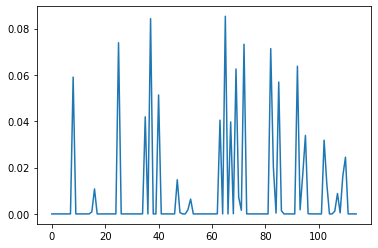

In [57]:
plt.plot(y)
#plt.ylim(0,0.005)

In [50]:
results

defaultdict(<function __main__.<lambda>()>,
            {'X': defaultdict(list,
                         {'avg': [0.18496589709629718,
                           1.6691736180173525e-15,
                           7.647246481299024e-05,
                           0.43534595484003674,
                           4.082234668498411e-07,
                           0.23659378548380514,
                           0.0011081402124317253,
                           1.6691736180173525e-15,
                           0.18496589709629718,
                           7.647246481299024e-05,
                           0.46428152265917316,
                           4.082234668498411e-07,
                           0.23659378548380514,
                           0.0011081402124317253,
                           1.6691736180173525e-15,
                           0.18496589709629382,
                           7.647246481299024e-05,
                           0.43534595484003674,
                          

In [7]:
len(neighbors[0])

247